# Import

In [1]:
import os
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from math import sqrt

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
import warnings
warnings.filterwarnings(action='ignore')

# Data load

In [4]:
data=pd.read_csv("../data/full_data.csv")
data.set_index('ymdhm',inplace=True)
data.index=pd.to_datetime(data.index)
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 565200 entries, 2013-01-01 00:00:00 to 2023-09-30 23:50:00
Data columns (total 25 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   wl_jamsu      565200 non-null  float64
 1   fw_jamsu      96819 non-null   float64
 2   wl_cheongdam  565200 non-null  float64
 3   fw_cheongdam  499875 non-null  float64
 4   wl_haengju    565200 non-null  float64
 5   fw_haengju    564939 non-null  float64
 6   wl_hangang    565200 non-null  float64
 7   fw_hangang    561917 non-null  float64
 8   wl_gwangin    565200 non-null  float64
 9   fw_gwangin    443666 non-null  float64
 10  wl_paldang    565200 non-null  float64
 11  fw_paldang    565140 non-null  float64
 12  wl_jungnang   565200 non-null  float64
 13  fw_jungnang   565141 non-null  float64
 14  wl_jeollyuri  565200 non-null  float64
 15  fw_jeollyuri  96803 non-null   float64
 16  swl           562228 non-null  float64
 17  inf           

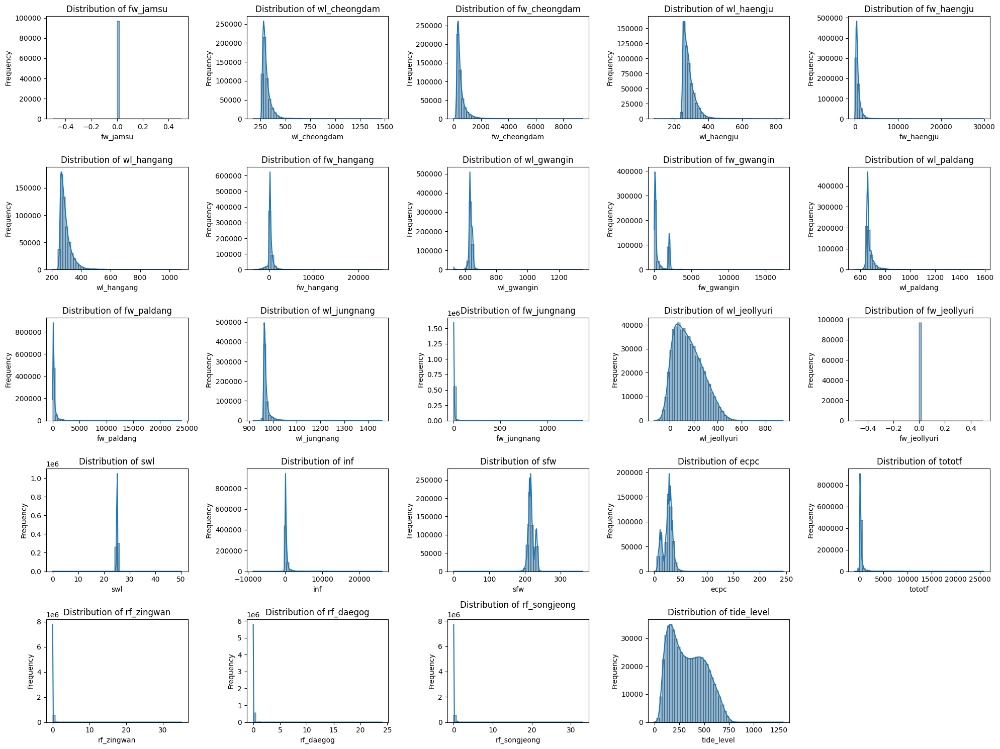

In [5]:
plt.figure(figsize=(20, 15))

for idx, col in enumerate(data.columns.drop('wl_jamsu'), 1):
    plt.subplot(5, 5, idx)
    sns.histplot(data[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show();

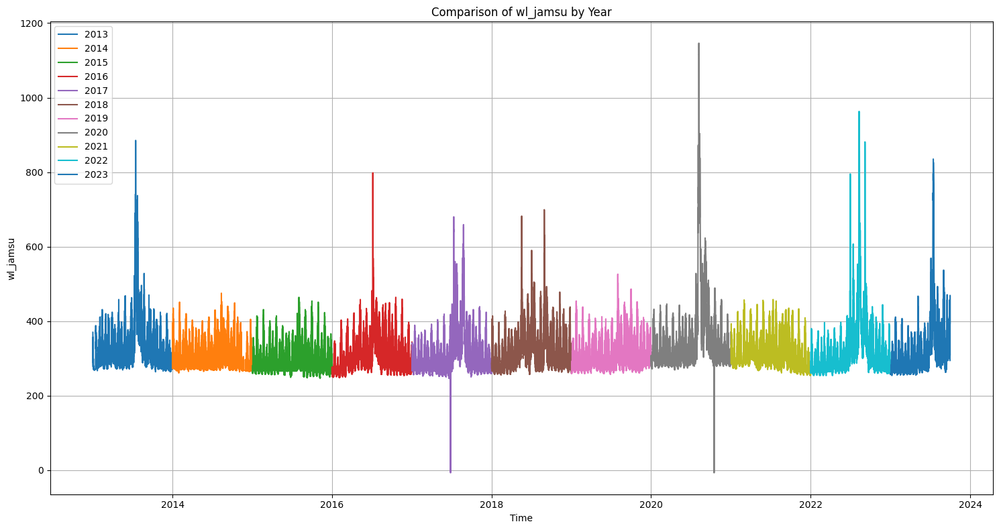

In [6]:
grouped_by_year = data.groupby(data.index.year)

plt.figure(figsize=(15, 8))
for year, group in grouped_by_year:
    plt.plot(group.index, group['wl_jamsu'], label=str(year))

plt.xlabel('Time')
plt.ylabel('wl_jamsu')
plt.title('Comparison of wl_jamsu by Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show();
del grouped_by_year;

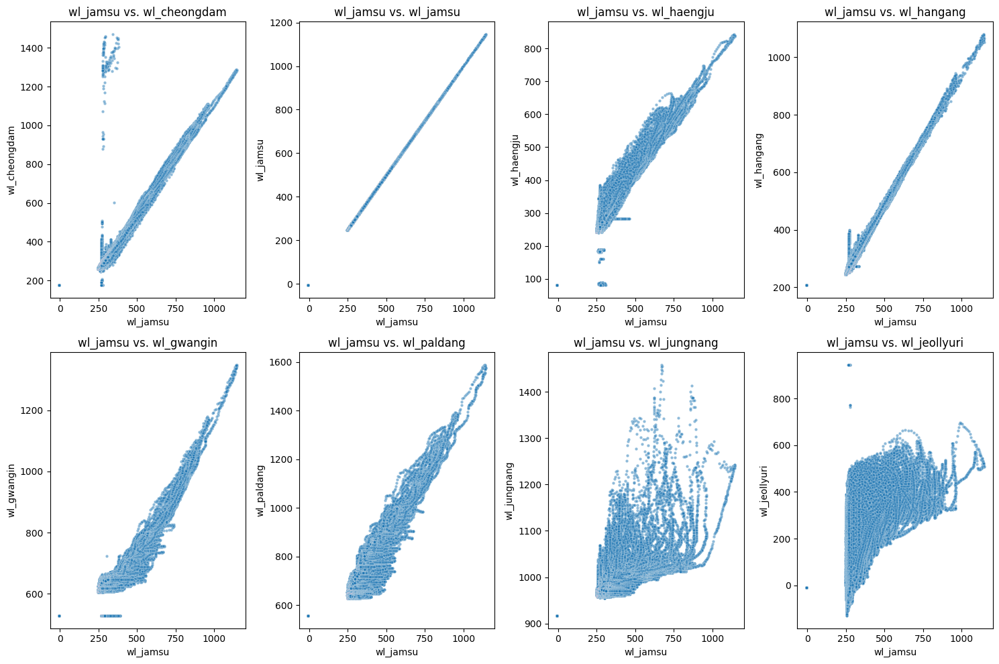

In [7]:
bridges_wl = ['wl_cheongdam', 'wl_jamsu','wl_haengju', 'wl_hangang', 'wl_gwangin', 'wl_paldang', 'wl_jungnang','wl_jeollyuri']

plt.figure(figsize=(15, 10))

for i, bridge in enumerate(bridges_wl, 1):
    plt.subplot(2, 4, i)
    sns.scatterplot(x=data['wl_jamsu'], y=data[bridge], alpha=0.5, s=10)
    plt.title(f'wl_jamsu vs. {bridge}')
    plt.xlabel('wl_jamsu')
    plt.ylabel(bridge)

plt.tight_layout()
plt.show();

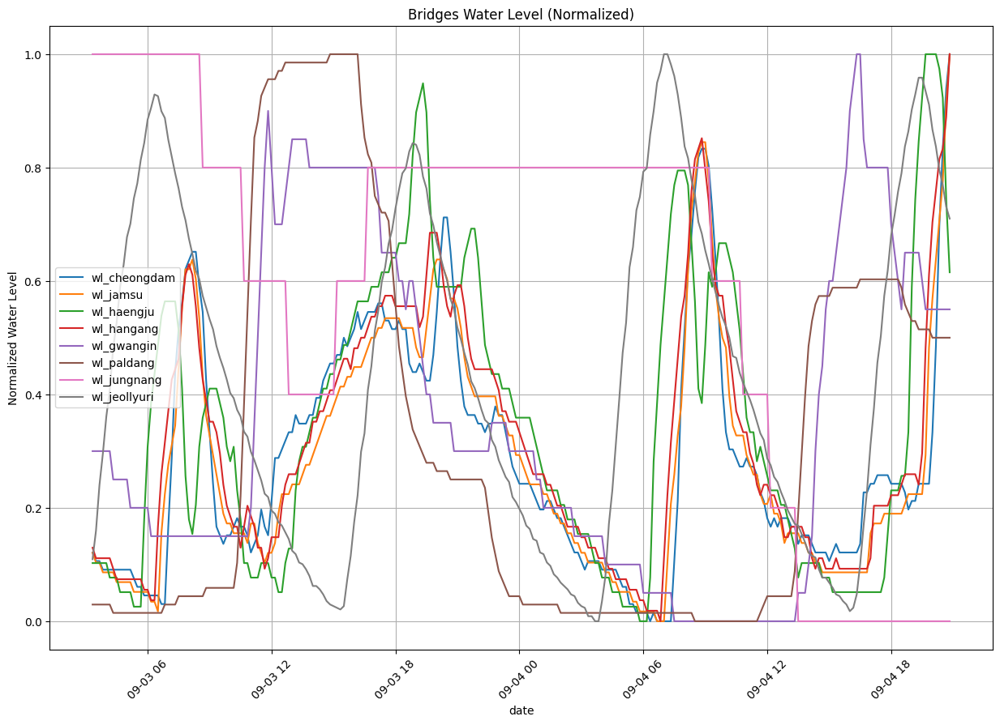

In [8]:
# Min-Max 스케일링 함수 정의
def min_max_scaling(data):
    min_val = min(data)
    max_val = max(data)
    scaled_data = [(x - min_val) / (max_val - min_val) for x in data]
    return scaled_data

start, end = 35300, 35550

plt.figure(figsize=(15, 10))

# 데이터 정규화 및 그래프 그리기
for bridge in bridges_wl:
    normalized_data = min_max_scaling(data[bridge][start:end])
    sns.lineplot(x=data.index[start:end], y=normalized_data, label=bridge)

plt.xlabel('date')
plt.ylabel('Normalized Water Level')
plt.title('Bridges Water Level (Normalized)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show();


In [9]:
tmp=data.copy()
tmp['ymdhm'] = tmp.index

tmp['year'] = tmp['ymdhm'].dt.year
tmp['month'] = tmp['ymdhm'].dt.month
tmp['day'] = tmp['ymdhm'].dt.day
tmp['hour'] = tmp['ymdhm'].dt.hour
tmp['minute'] = tmp['ymdhm'].dt.minute

month_names = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]

fig = go.Figure()
for month in range(1, 13):
    for year in range(2013, 2023):
        monthly_data = tmp[(tmp['year'] == year) & (tmp['month'] == month)]
        showlegend = True if month == 1 else False  
        fig.add_trace(
            go.Scatter(x=monthly_data['day'] + monthly_data['hour']/24 + monthly_data['minute']/1440,
                       y=monthly_data['wl_jamsu'],
                       name=f'{year}년',
                       mode='lines',
                       visible='legendonly', 
                       showlegend=showlegend,
                       opacity=0.7)
        )
updatemenu = []
buttons = []
for index, month_name in enumerate(month_names):
    visible = ['legendonly'] * (12 * 10)  
    button = dict(
        args=[{'visible': visible}],
        label=month_name,
        method='update'
    )
    buttons.append(button)
updatemenu.append(go.layout.Updatemenu(buttons=buttons, direction="down"))

fig.update_layout(
    title_text='잠수교 월별 시계열 데이터 (2013-2023)', 
    updatemenus=updatemenu,
    width=1000,  
    height=600  
)
fig.show();

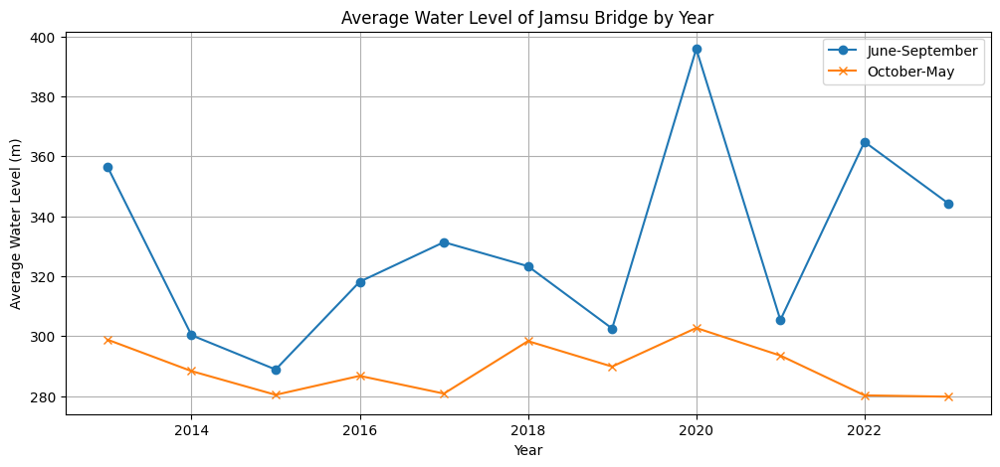

In [10]:
# 각 년별로 6-9월(홍수기)평균과, 10-5월 비홍수기 잠수교 수위평균 비교
data_6to9 = data[data.index.month.isin(range(6, 10))]
data_10to5 = data[~data.index.month.isin(range(6, 10))]

mean_6to9 = data_6to9.groupby(data_6to9.index.year)['wl_jamsu'].mean()
mean_10to5 = data_10to5.groupby(data_10to5.index.year)['wl_jamsu'].mean()

plt.figure(figsize=(12, 5))
mean_6to9.plot(label="June-September", marker='o')
mean_10to5.plot(label="October-May", marker='x')
plt.title('Average Water Level of Jamsu Bridge by Year')
plt.xlabel('Year')
plt.ylabel('Average Water Level (m)')
plt.legend()
plt.grid(True)
plt.show();


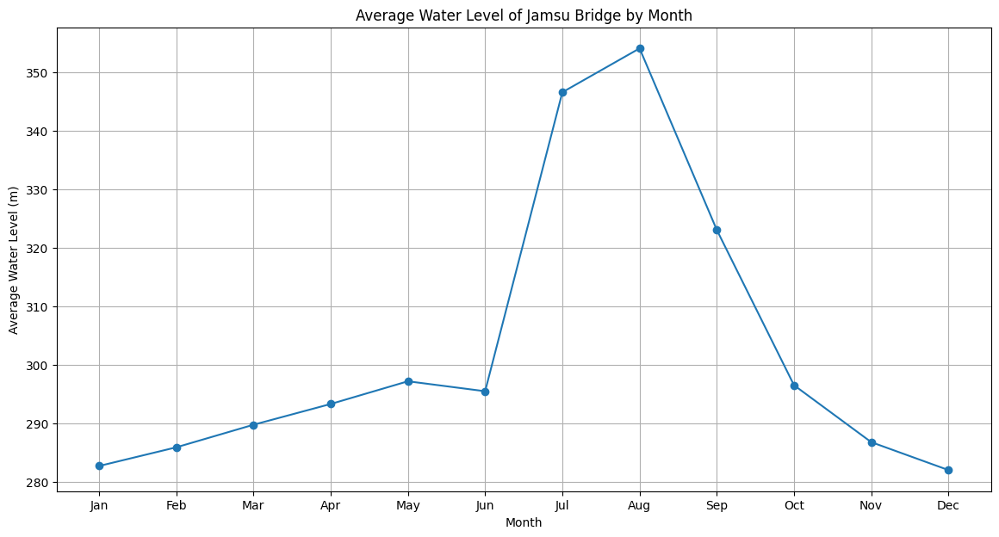

In [11]:
# 월별 평균 수위 비교
mean_by_month = data.groupby(data.index.month)['wl_jamsu'].mean()

plt.figure(figsize=(14, 7))
mean_by_month.plot(label="Average Water Level by Month", marker='o')
plt.title('Average Water Level of Jamsu Bridge by Month')
plt.xlabel('Month')
plt.xticks(list(range(1, 13)), ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.ylabel('Average Water Level (m)')
plt.grid(True)
plt.show();

# Preprocessing
눈으로 보면서, 튀어보이는 값들만 제거

## wl_jamsu(잠수교 수위)

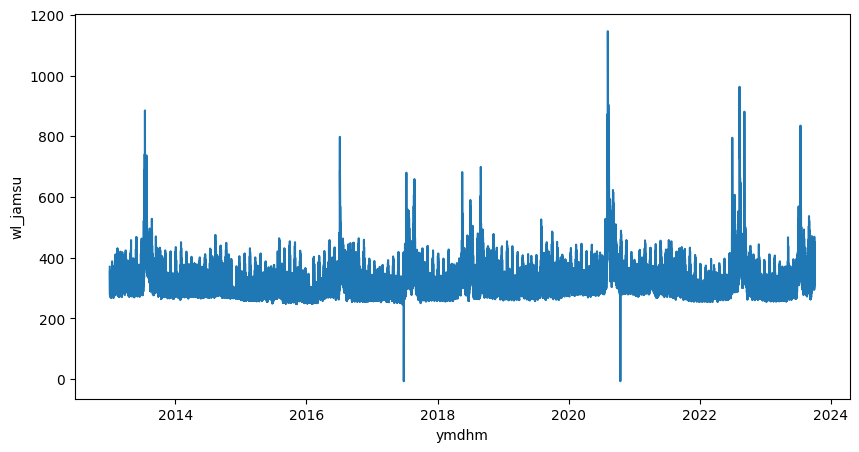

In [12]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_jamsu'], ax=ax)
plt.show();

In [13]:
data[data['wl_jamsu']<200][['wl_jamsu']]
data['wl_jamsu']=data['wl_jamsu'].replace(-6.8,np.nan);

## fw_jamsu(잠수교 유량)

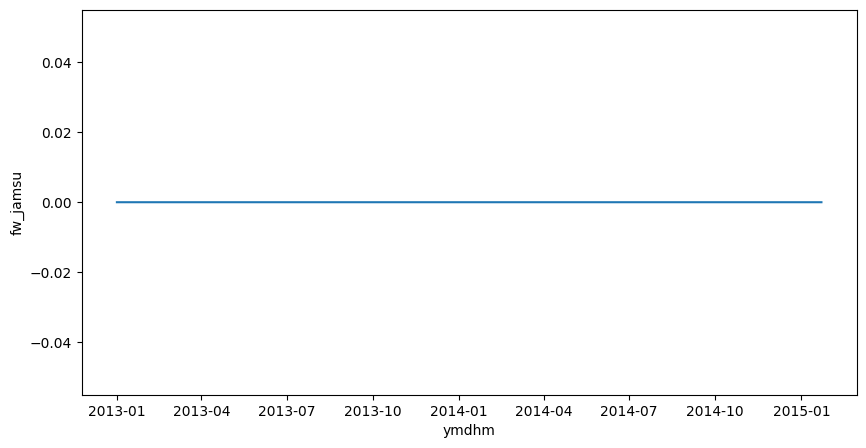

In [14]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_jamsu'], ax=ax)
plt.show();

In [15]:
data.drop('fw_jamsu',inplace=True, axis=1)

## wl_cheongdam(청담대교 수위)

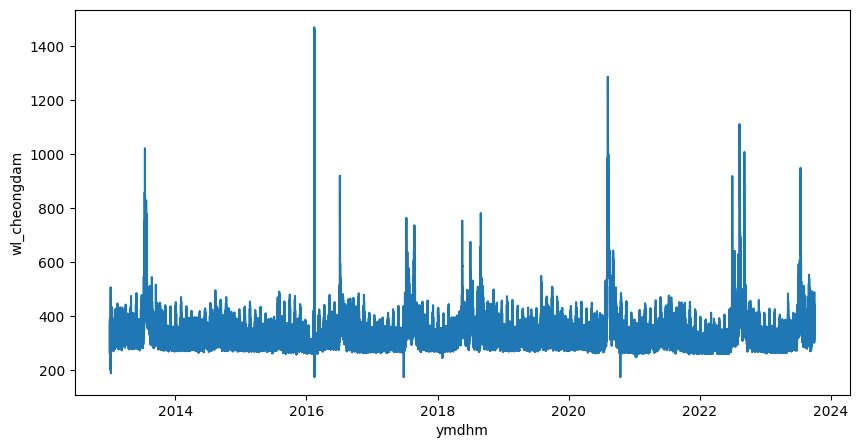

In [16]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_cheongdam'], ax=ax)
plt.show();

In [17]:
data.loc[data['wl_cheongdam'] <= 250, 'wl_cheongdam'] = np.nan

## fw_cheongdam(청담대교 유량)

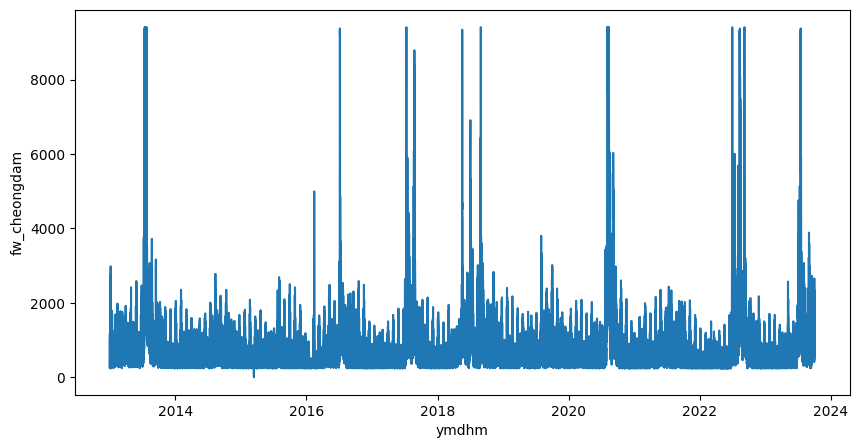

In [18]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_cheongdam'], ax=ax)
plt.show();

In [19]:
data.loc[data['fw_cheongdam'] <= 5, 'fw_cheongdam'] = np.nan

## wl_haengju(행주대교 수위)

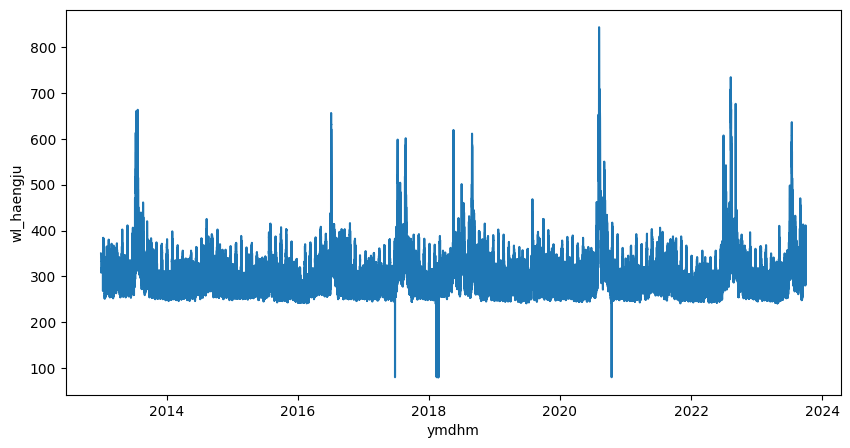

In [20]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_haengju'], ax=ax)
plt.show();

In [21]:
data.loc[data['wl_haengju'] <= 200, 'wl_haengju'] = np.nan

## fw_haengju(행주대교 유량)

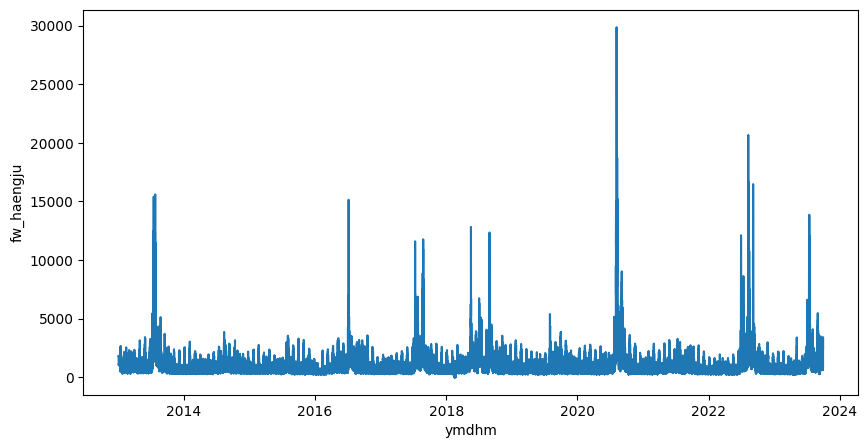

In [22]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_haengju'], ax=ax)
plt.show();

## wl_hangang(한강대교 수위)

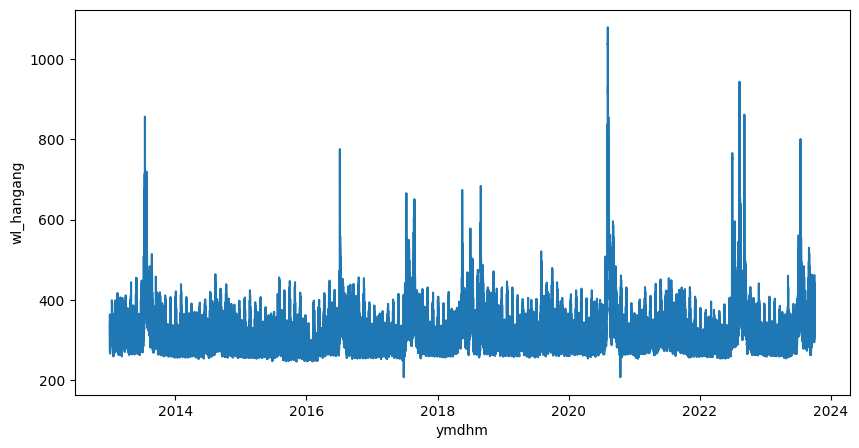

In [23]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_hangang'], ax=ax)
plt.show();

In [24]:
data.loc[data['wl_hangang'] <= 210, 'wl_hangang'] = np.nan;

## fw_hangang(한강대교 유량)

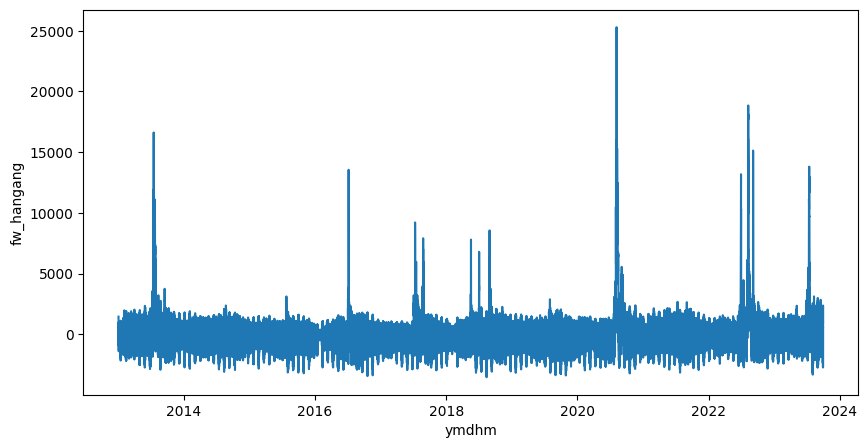

In [25]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_hangang'], ax=ax)
plt.show();

In [26]:
data['fw_hangang'] = data['fw_hangang'].abs()

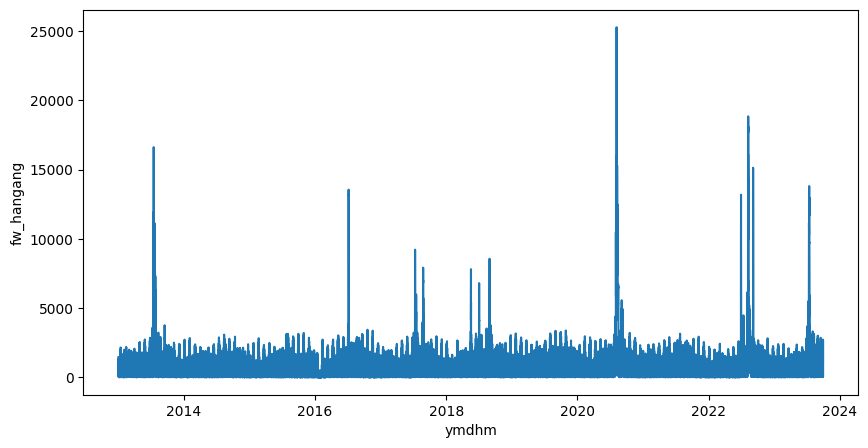

In [27]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_hangang'], ax=ax)
plt.show();

## wl_gwangin(광진대교 수위)

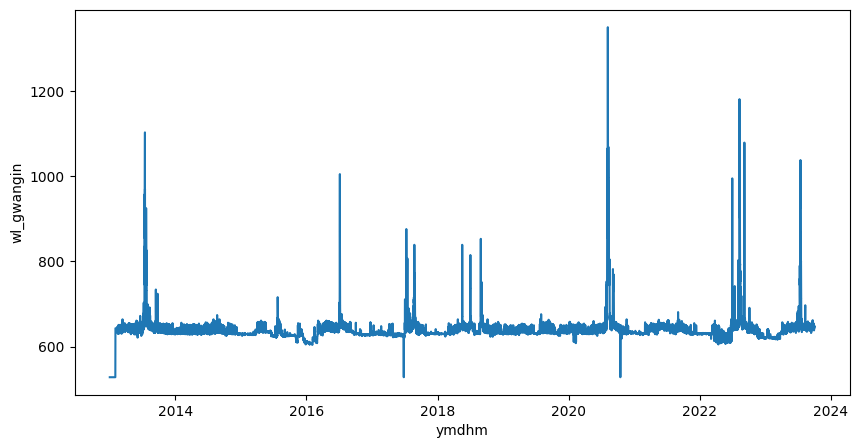

In [28]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_gwangin'], ax=ax)
plt.show();

In [29]:
data[data['wl_gwangin']<=528][['wl_jamsu','wl_gwangin']]
data.loc[data['wl_gwangin'] <= 528, 'wl_gwangin'] = np.nan;

## fw_gwangin(광진대교 유량)

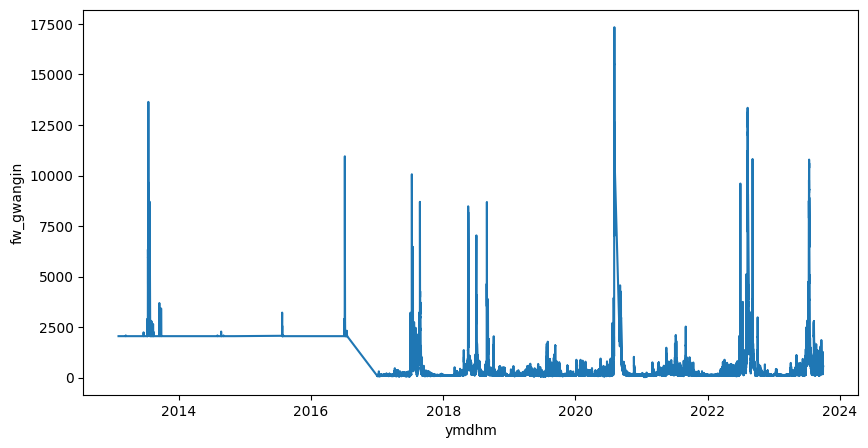

In [30]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_gwangin'], ax=ax)
plt.show();

In [31]:
data.drop('fw_gwangin',inplace=True, axis=1)

## wl_paldang(팔당대교 수위)

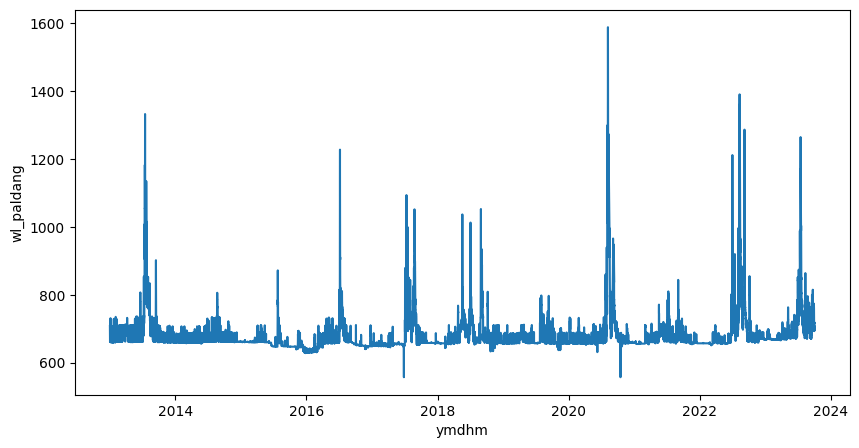

In [32]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_paldang'], ax=ax)
plt.show();

In [33]:
data[data['wl_paldang']<=557][['wl_jamsu','wl_paldang']]
data.loc[data['wl_paldang'] <= 557, 'wl_paldang'] = np.nan;

## fw_paldang(팔당대교 유량)

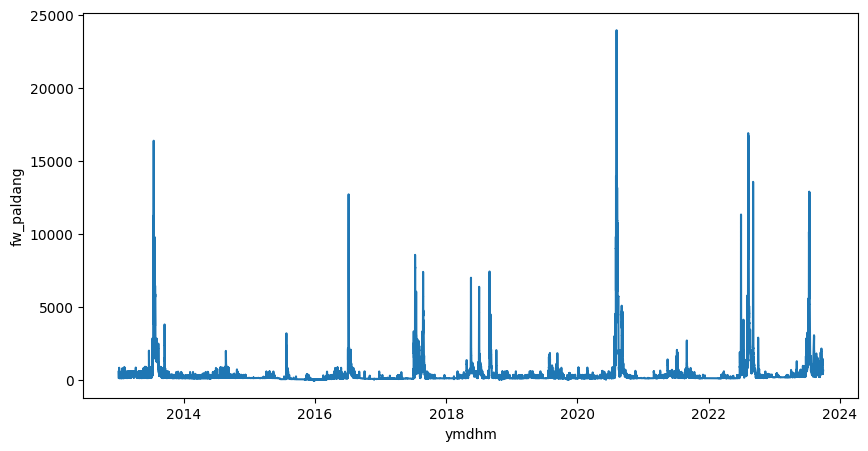

In [34]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_paldang'], ax=ax)
plt.show();

## wl_jungnang(중랑교 수위)

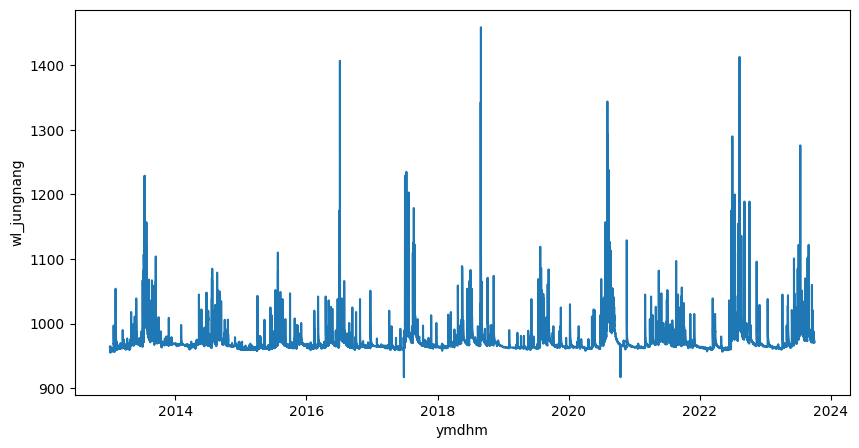

In [35]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_jungnang'], ax=ax)
plt.show();

In [36]:
data[data['wl_jungnang']<=917][['wl_jamsu','wl_jungnang']]
data.loc[data['wl_jungnang'] <= 917, 'wl_jungnang'] = np.nan;

## fw_jungnang(중랑교 유량)

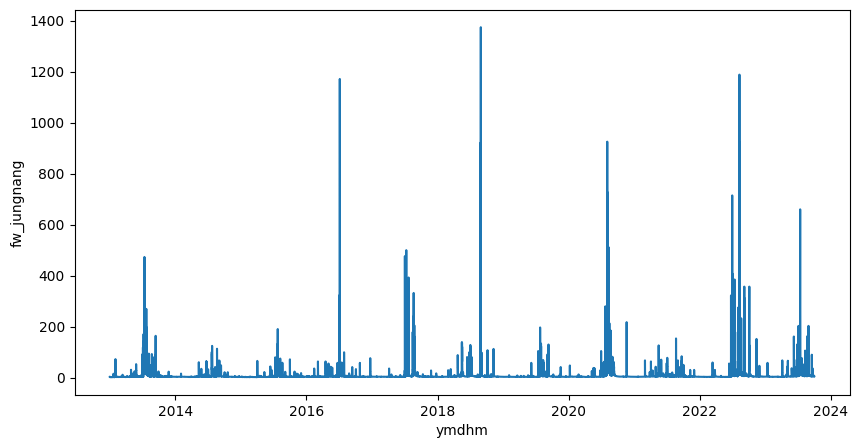

In [37]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_jungnang'], ax=ax)
plt.show();

## wl_jeollyuri

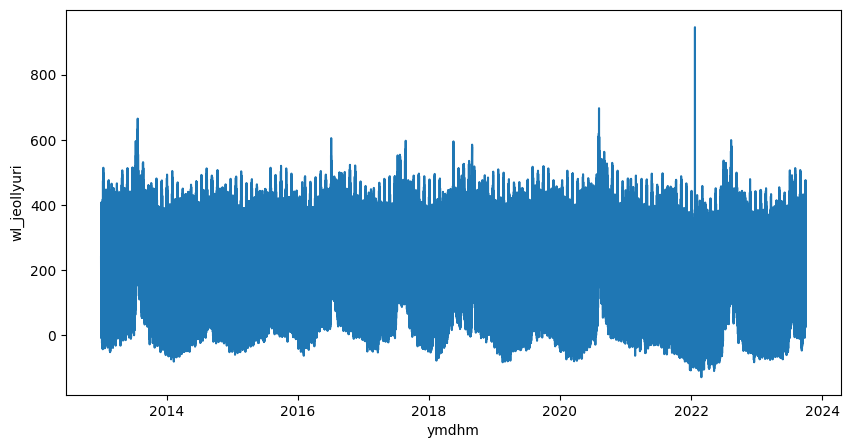

In [38]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['wl_jeollyuri'], ax=ax)
plt.show();

In [41]:
data.loc[data['wl_jeollyuri'] <= 0, 'wl_jeollyuri'] = np.nan;

## fw_jeollyuri(전류리 유량)

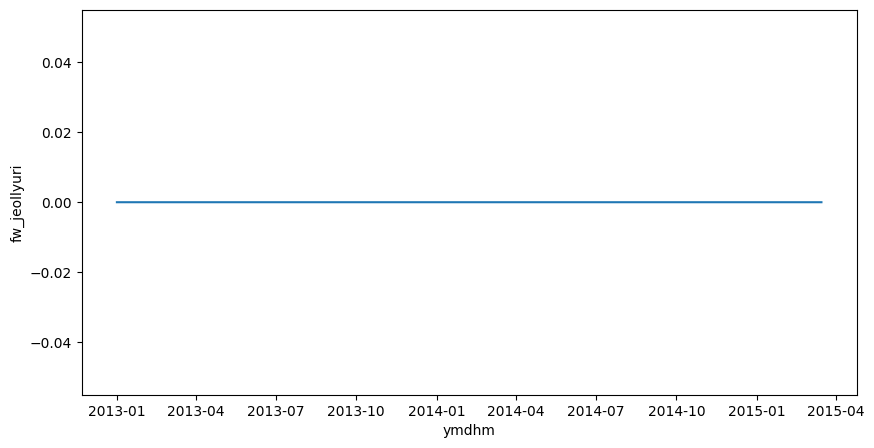

In [42]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['fw_jeollyuri'], ax=ax)
plt.show();

In [43]:
data.drop(['fw_jeollyuri'],axis=1,inplace=True)

## swl(팔당댐 수위)

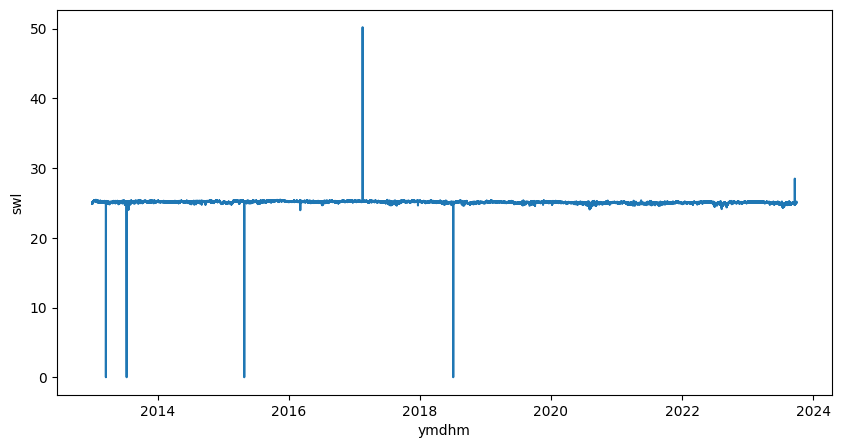

In [44]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['swl'], ax=ax)
plt.show();

In [49]:
data.loc[(data['swl'] <= 20) | (data['swl'] > 27), 'swl'] = np.nan

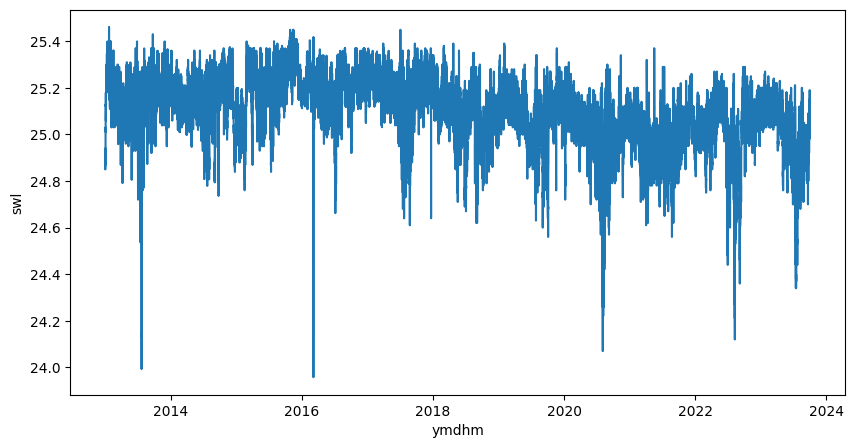

In [50]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['swl'], ax=ax)
plt.show();

## inf(팔당댐 유입량)

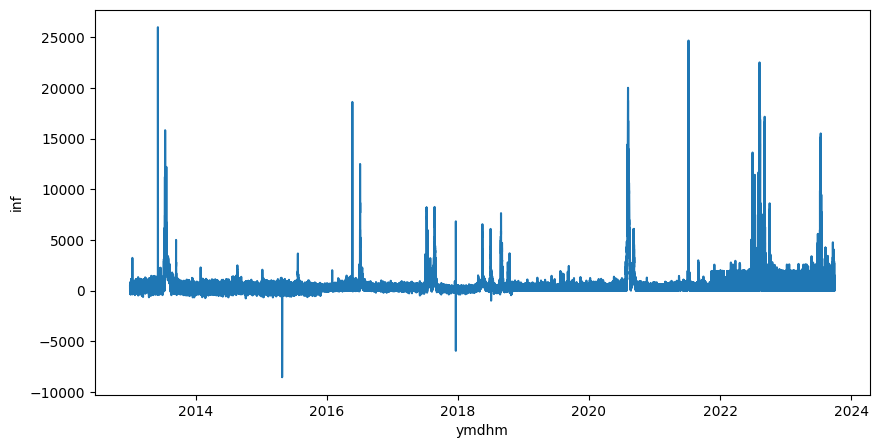

In [51]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['inf'], ax=ax)
plt.show();

In [52]:
data.loc[data['inf'] < 0, 'inf'] = np.nan

## sfw(팔당댐 저수량)

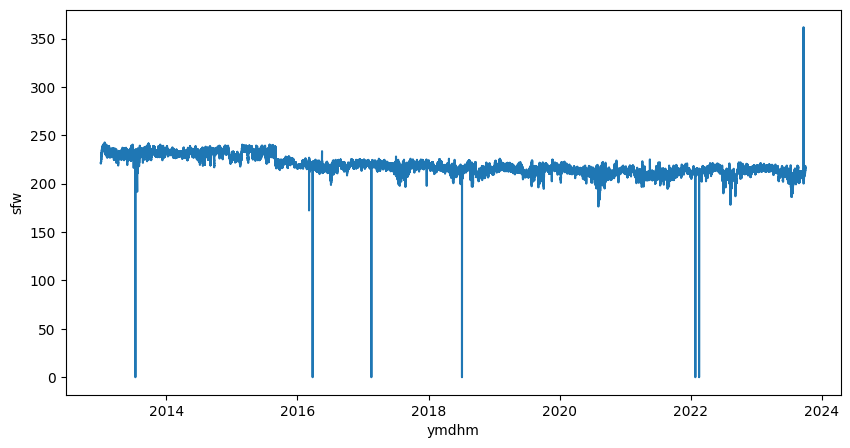

In [53]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['sfw'], ax=ax)
plt.show();

In [54]:
data.loc[data['sfw'] < 170, 'sfw'] = np.nan
data.loc[data['sfw'] > 300, 'sfw'] = np.nan

## ecpc(팔당댐 공용량량)

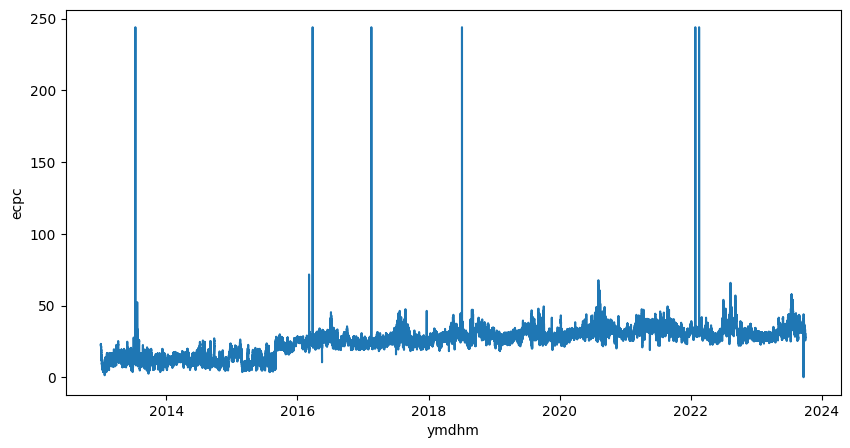

In [55]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['ecpc'], ax=ax)
plt.show();

In [56]:
data.loc[data['ecpc'] > 80, 'ecpc'] = np.nan

## tototf(팔당댐 방류량)

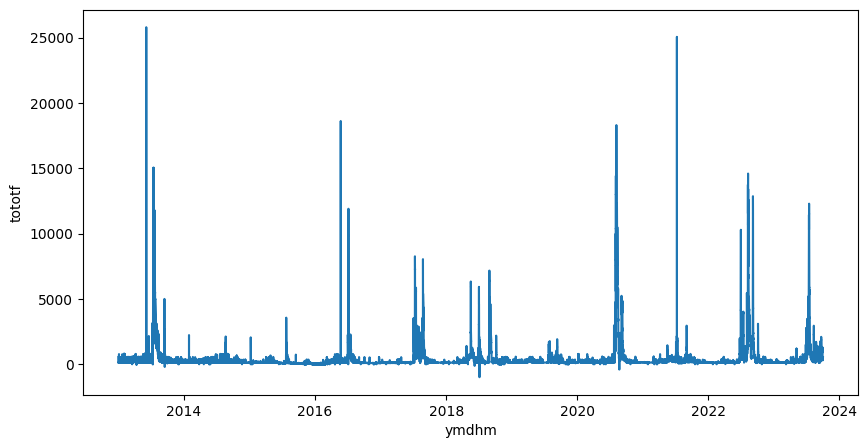

In [57]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['tototf'], ax=ax)
plt.show();

In [58]:
data.loc[data['tototf'] < 0, 'tototf'] = np.nan

## rf_zingwan(진관교 강수량)

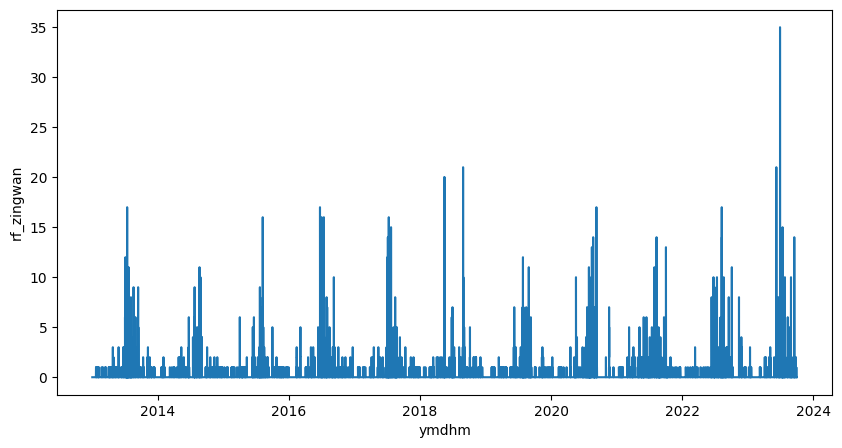

In [59]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['rf_zingwan'], ax=ax)
plt.show();

## rf_daegog(대곡교 강수량)

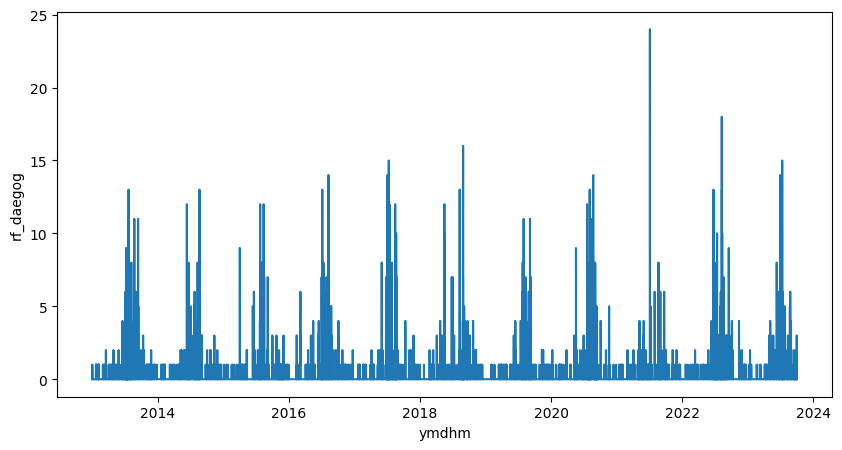

In [60]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['rf_daegog'], ax=ax)
plt.show();

## rf_songjeong(송정동 강수량)

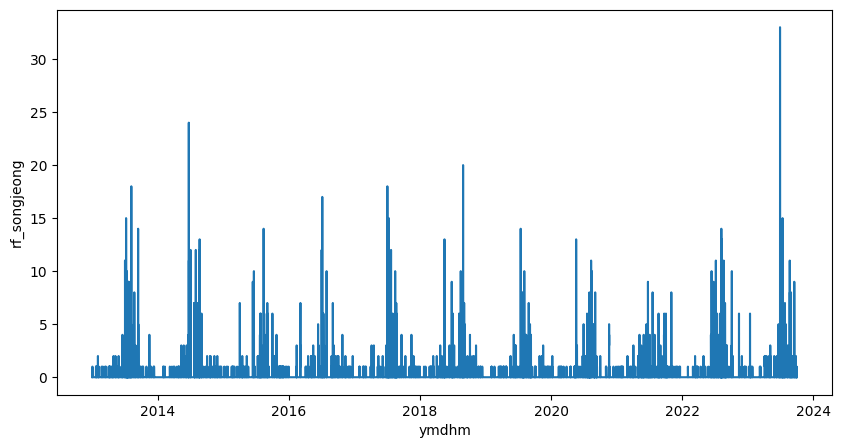

In [61]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['rf_songjeong'], ax=ax)
plt.show();

## tide_level(강화대교 조위)

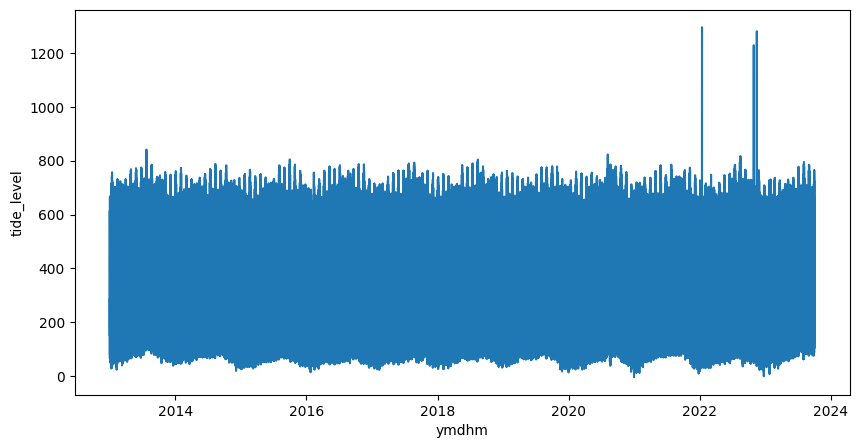

In [62]:
f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(x=data.index, y=data['tide_level'], ax=ax)
plt.show();

In [63]:
data.loc[data['tide_level'] > 900, 'tide_level'] = np.nan

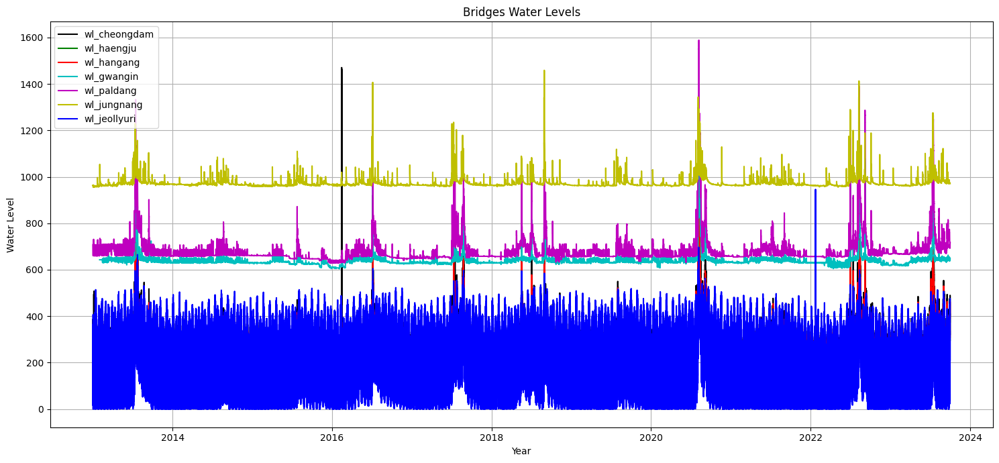

In [64]:
bridges_wl = ['wl_cheongdam', 'wl_haengju', 'wl_hangang', 'wl_gwangin', 'wl_paldang', 'wl_jungnang','wl_jeollyuri']
colors = ['k', 'g', 'r', 'c', 'm', 'y', 'b']

plt.figure(figsize=(15, 7))

for i, bridge in enumerate(bridges_wl):
    plt.plot(data.index, data[bridge], label=bridge, color=colors[i])

plt.title('Bridges Water Levels')
plt.xlabel('Year')
plt.ylabel('Water Level')
plt.legend(loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show();


# Feature engineering

In [65]:
# 잠수교 수위의 변화에 대한 컬럼을 추가(이전과 현재 잠수교 수위의 차이=변화량)
data['wl_jamsu_rate'] = data['wl_jamsu'].diff()

# 위 eda들을 통해 시간에 따른 수위변화가 영향이 있을 것이라 생각
data['hour'] = data.index.hour
data['month'] = data.index.month

data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 565200 entries, 2013-01-01 00:00:00 to 2023-09-30 23:50:00
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   wl_jamsu       565141 non-null  float64
 1   wl_cheongdam   564873 non-null  float64
 2   fw_cheongdam   499874 non-null  float64
 3   wl_haengju     564634 non-null  float64
 4   fw_haengju     564939 non-null  float64
 5   wl_hangang     565141 non-null  float64
 6   fw_hangang     561917 non-null  float64
 7   wl_gwangin     560677 non-null  float64
 8   wl_paldang     565141 non-null  float64
 9   fw_paldang     565140 non-null  float64
 10  wl_jungnang    565141 non-null  float64
 11  fw_jungnang    565141 non-null  float64
 12  wl_jeollyuri   527995 non-null  float64
 13  swl            562205 non-null  float64
 14  inf            546543 non-null  float64
 15  sfw            562205 non-null  float64
 16  ecpc           562206 non-null  float64


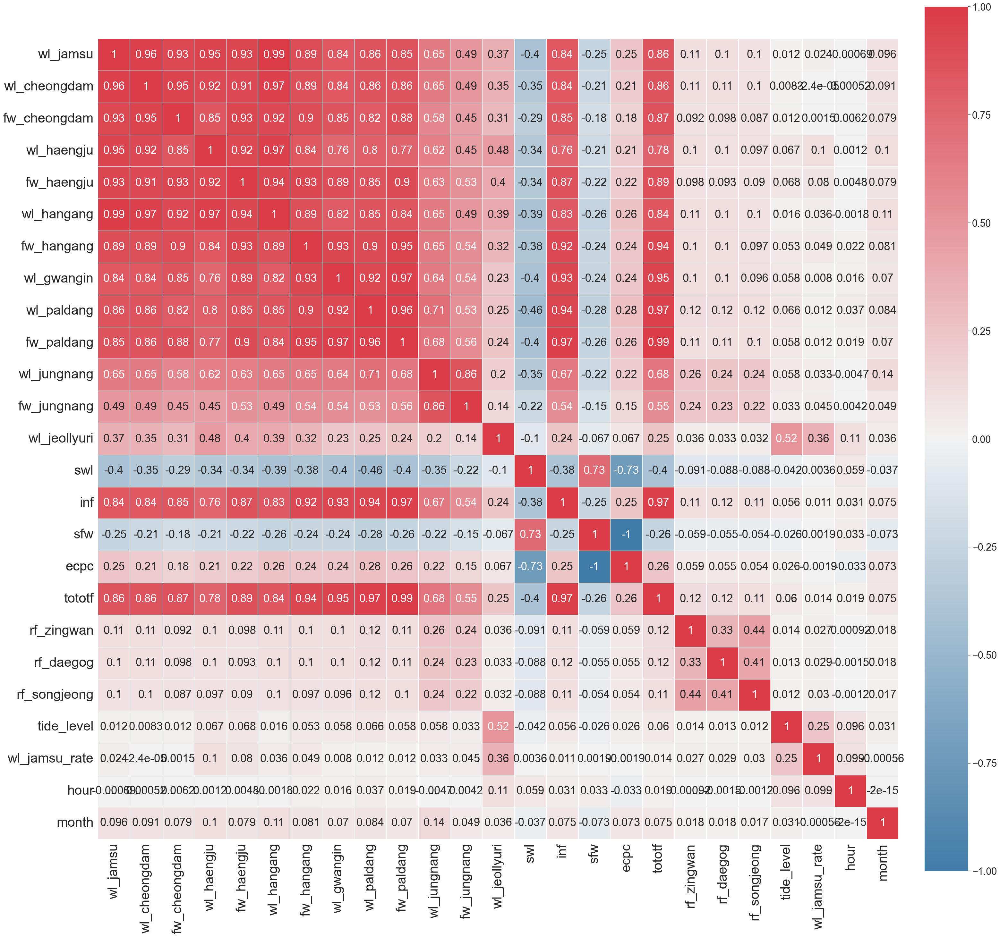

In [66]:
corr = data.corr()
sns.set(font_scale=2)
cols=[i for i in data.columns]
fig, ax = plt.subplots(figsize=(35,35))
cmap = sns.diverging_palette(240, 10, as_cmap=True)
heatmap = sns.heatmap(corr, vmax=1, linewidths=0.1, square=True, annot=True, cmap=cmap, vmin=-1,
            linecolor="white",xticklabels = cols ,annot_kws = {'size':25},yticklabels = cols,
            cbar_kws={'fraction':0.05, 'pad':0.03})

heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=30)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=30,rotation=360)

plt.show();
#fig.savefig(f"image/상관계수히트맵", transparent = True,dpi=300, bbox_inches='tight');

In [67]:
data.drop(['ecpc'],axis=1,inplace=True) # sfw와 상관관계가 -1

In [68]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 565200 entries, 2013-01-01 00:00:00 to 2023-09-30 23:50:00
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   wl_jamsu       565141 non-null  float64
 1   wl_cheongdam   564873 non-null  float64
 2   fw_cheongdam   499874 non-null  float64
 3   wl_haengju     564634 non-null  float64
 4   fw_haengju     564939 non-null  float64
 5   wl_hangang     565141 non-null  float64
 6   fw_hangang     561917 non-null  float64
 7   wl_gwangin     560677 non-null  float64
 8   wl_paldang     565141 non-null  float64
 9   fw_paldang     565140 non-null  float64
 10  wl_jungnang    565141 non-null  float64
 11  fw_jungnang    565141 non-null  float64
 12  wl_jeollyuri   527995 non-null  float64
 13  swl            562205 non-null  float64
 14  inf            546543 non-null  float64
 15  sfw            562205 non-null  float64
 16  tototf         562222 non-null  float64


# Interpolate

In [69]:
window_size = 3  # 이전 3개 행을 참조

for column in data.columns:
    for i in range(2, len(data)):
        if pd.isnull(data.at[data.index[i], column]):
            if i - window_size < 0:
                continue  # 이전 행이 없는 경우 처리하지 않음
            data.at[data.index[i], column] = data[column][i - window_size:i].mean()

data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 565200 entries, 2013-01-01 00:00:00 to 2023-09-30 23:50:00
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   wl_jamsu       565200 non-null  float64
 1   wl_cheongdam   565200 non-null  float64
 2   fw_cheongdam   565200 non-null  float64
 3   wl_haengju     565200 non-null  float64
 4   fw_haengju     565200 non-null  float64
 5   wl_hangang     565200 non-null  float64
 6   fw_hangang     565200 non-null  float64
 7   wl_gwangin     560736 non-null  float64
 8   wl_paldang     565200 non-null  float64
 9   fw_paldang     565200 non-null  float64
 10  wl_jungnang    565200 non-null  float64
 11  fw_jungnang    565200 non-null  float64
 12  wl_jeollyuri   565200 non-null  float64
 13  swl            565200 non-null  float64
 14  inf            565200 non-null  float64
 15  sfw            565200 non-null  float64
 16  tototf         565200 non-null  float64


In [71]:
data.to_csv("../data/ppd_data.csv")